In [18]:
from pathlib import Path
REPO_ROOT = next(p for p in [Path.cwd().resolve(), *Path.cwd().resolve().parents] if (p / "absorption_paper_source_data").is_dir())
import sys
from pathlib import Path
import os
import shutil
import pickle

import numpy as np
import pandas as pd
import plotly.graph_objects as go
from PIL import Image
from ase.io import read
from ase.build import make_supercell
from ase.cell import Cell
from ase.spacegroup import get_spacegroup

project_root = Path(str(REPO_ROOT)).resolve()
if str(project_root) not in sys.path:
    sys.path.insert(0, str(project_root))


In [19]:
import re
import pandas as pd
from pathlib import Path

cif_path = Path(str(REPO_ROOT / "diffBloch_version_0.0.1/data/cspbbr3/CsPbBr_P67-crot-050_dyn.cif_pets"))

def load_reflections_and_angles(path: Path):
    lines = path.read_text().splitlines()

    def parse_loop(lines, start_kw):
        start = None
        for i, line in enumerate(lines):
            if line.strip().startswith("loop_") and start_kw in " ".join(lines[i+1:i+10]):
                start = i
                break
        if start is None:
            return pd.DataFrame(), None

        headers = []
        j = start + 1
        while j < len(lines) and lines[j].strip().startswith("_"):
            headers.append(lines[j].strip())
            j += 1

        data = []
        for line in lines[j:]:
            if re.match(r"^\s*[-0-9]", line):
                data.append(line.split())
            else:
                break

        df = pd.DataFrame(data, columns=headers)
        df = df.apply(pd.to_numeric, errors="ignore")
        return df, j

    df_refl_raw, _ = parse_loop(lines, "_refln_index_h")
    df_refl = df_refl_raw.rename(columns={
        "_refln_index_h": "h",
        "_refln_index_k": "k",
        "_refln_index_l": "l",
        "_refln_intensity_meas": "I_meas",
        "_refln_intensity_sigma": "sigma",
        "_refln_zone_axis_id": "zone_id",
    })

    df_zone_raw, _ = parse_loop(lines, "_diffrn_zone_axis_u")
    df_zone = df_zone_raw.rename(columns={
        "_diffrn_zone_axis_id": "zone_id",
        "_diffrn_zone_axis_u": "u",
        "_diffrn_zone_axis_v": "v",
        "_diffrn_zone_axis_w": "w",
        "_diffrn_zone_axis_precession_angle": "precession_angle",
        "_diffrn_zone_axis_alpha": "alpha",
        "_diffrn_zone_axis_beta": "beta",
        "_diffrn_zone_axis_omega": "omega",
        "_diffrn_zone_axis_scale": "scale",
    })

    return df_refl, df_zone



In [20]:

def calculate_reciprocal_lattice_vectors(unit_cell):
    """Calculate reciprocal lattice vectors from the unit cell."""
    try:
        # Convert ASE Cell to numpy array
        unit_cell_array = unit_cell.array

        # Print the unit cell to diagnose its format and contents
        print("Unit cell data:", unit_cell_array)
        print("Data type:", type(unit_cell_array))
        print("Shape:", unit_cell_array.shape)

        # Calculate reciprocal lattice vectors
        volume = np.linalg.det(unit_cell_array)
        if volume == 0:
            raise ValueError("Unit cell volume is zero, cannot compute reciprocal lattice vectors.")
        
        reciprocal_lattice_vectors = 2 * np.pi * np.linalg.inv(unit_cell_array).T
        return reciprocal_lattice_vectors
    except Exception as e:
        print("Failed to calculate reciprocal lattice vectors:", str(e))
        return None

def make_hkl_grid(
    cell: np.ndarray | Cell,
    g_max: float,
    axes: tuple[int, ...] = (0, 1, 2),
) -> np.ndarray:
    gpts = reciprocal_space_gpts(cell, g_max)

    freqs = tuple(np.fft.fftfreq(n, d=1 / n).astype(int) for n in gpts)

    freqs = tuple(freqs[axis] for axis in axes)

    hkl_grids = np.meshgrid(*freqs, indexing="ij")
    hkl = np.stack(hkl_grids, axis=-1)

    hkl = hkl.reshape((-1, len(axes)))
    g_vec = calculate_g_vec(hkl, cell)
    hkl = hkl[(g_vec**2).sum(-1) <= g_max**2]
    return hkl 

def calculate_g_vec(hkl: np.ndarray, cell: np.ndarray | Cell) -> np.ndarray:
    return hkl @ reciprocal_cell(cell)


def calculate_g_vec_length(hkl: np.ndarray, cell: np.ndarray | Cell) -> np.ndarray:
    return np.linalg.norm(calculate_g_vec(hkl, cell), axis=-1)


def reciprocal_cell(cell: np.ndarray | Cell) -> np.ndarray:
    """
    Calculate the reciprocal cell of a unit cell.

    Parameters
    ----------
    cell : 3x3 np.ndarray
        The unit cell.

    Returns
    -------
    3x3 np.ndarray
        The reciprocal cell.
    """
    return np.linalg.pinv(cell).transpose()

def reciprocal_space_gpts(
    cell: np.ndarray | Cell,
    g_max: float,
) -> tuple[int, int, int]:
    # if isinstance(g_max, Number):
    #    g_max = (g_max,) * 3

    # assert len(g_max) == 3

    dk = np.linalg.norm(reciprocal_cell(cell), axis=1)

    gpts = (
        int(np.ceil(g_max / dk[0])) * 2 + 1,
        int(np.ceil(g_max / dk[1])) * 2 + 1,
        int(np.ceil(g_max / dk[2])) * 2 + 1,
    )
    return gpts

def get_k(hkls, reciprocal_lattice_vectors):
    return hkls @ reciprocal_lattice_vectors

def generate_u_matrix(cif_file):

    ub = generate_ub_matrix(cif_file)
    Binv = generate_Binv(cif_file=cif_file)
    U = np.matmul(ub, Binv)

    return U


def generate_ub_matrix(cif_file):
    # print(cif_file.keys())
    ub_11 = float(cif_file["pets"]["_diffrn_orient_matrix_UB_11"])
    ub_12 = float(cif_file["pets"]["_diffrn_orient_matrix_UB_12"])
    ub_13 = float(cif_file["pets"]["_diffrn_orient_matrix_UB_13"])
    ub_21 = float(cif_file["pets"]["_diffrn_orient_matrix_UB_21"])
    ub_22 = float(cif_file["pets"]["_diffrn_orient_matrix_UB_22"])
    ub_23 = float(cif_file["pets"]["_diffrn_orient_matrix_UB_23"])
    ub_31 = float(cif_file["pets"]["_diffrn_orient_matrix_UB_31"])
    ub_32 = float(cif_file["pets"]["_diffrn_orient_matrix_UB_32"])
    ub_33 = float(cif_file["pets"]["_diffrn_orient_matrix_UB_33"])

    ub = np.array([[ub_11, ub_12, ub_13], [ub_21, ub_22, ub_23], [ub_31, ub_32, ub_33]])

    return ub


In [21]:
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D  # noqa
from scipy.spatial.transform import Rotation as R

output_folder = Path(str(REPO_ROOT / "absorption_paper_source_data/cspbbr3/outputs/reciprocal_frames"))
output_folder.mkdir(parents=True, exist_ok=True)


def plot_ewald_sphere_and_vectors(k_vectors, hkls, wavelength,
                                  current_set, prev_set, step=None):

    XY_lim = 1.0
    k0 = 1.0 / wavelength

    fig = plt.figure(figsize=(10, 10), dpi=300)
    ax = fig.add_subplot(111, projection="3d")

    # -------------------------------------------------
    # Ewald sphere (VISIBLE)
    # -------------------------------------------------
    u, v = np.mgrid[0:2*np.pi:300j, 0.90*np.pi:np.pi:80j]
    x = k0 * np.sin(v) * np.cos(u)
    y = k0 * np.sin(v) * np.sin(u)
    z = k0 * np.cos(v) + k0  # shift center to (0, 0, k0)

    ax.plot_surface(
        x, y, z,
        color="lightskyblue",
        alpha=0.25,
        linewidth=0
    )

    # Rim circle
    rim_u = np.linspace(0, 2*np.pi, 600)
    xr = k0 * np.cos(rim_u)
    yr = k0 * np.sin(rim_u)
    zr = np.zeros_like(rim_u) + k0
    ax.plot(xr, yr, zr, color="dodgerblue", linewidth=2.0)

    # -------------------------------------------------
    # TRUE curved-sphere excitation error:
    #   s_g = (|g + k0 zhat|^2 − k0^2) / (2 k0)
    # -------------------------------------------------
    g = k_vectors
    k0_vec = np.array([0.0, 0.0, k0])
    g_plus_k0 = g + k0_vec

    s_exc = (np.sum(g_plus_k0 * g_plus_k0, axis=1) - k0*k0) / (2.0 * k0)

    # -------------------------------------------------
    # Scatter plot (EXCITATION ERROR COLOR)
    # -------------------------------------------------
    sc = ax.scatter(
        g[:, 0], g[:, 1], g[:, 2],
        c=s_exc,
        cmap="coolwarm",
        s=40,
        alpha=1.0
    )

    # Colorbar
    cbar = plt.colorbar(sc, ax=ax, shrink=0.65)
    cbar.set_label(r"$s_g\ \mathrm{(Å^{-1})}$", rotation=270, labelpad=18)

    # -------------------------------------------------
    # AXES (FULLY VISIBLE AGAIN)
    # -------------------------------------------------

    # Tick marks back
    ax.set_xticks(np.linspace(-XY_lim, XY_lim, 5))
    ax.set_yticks(np.linspace(-XY_lim, XY_lim, 5))
    ax.set_zticks(np.linspace(-XY_lim, XY_lim, 5))

    # Pane backgrounds visible
    ax.xaxis.pane.set_visible(True)
    ax.yaxis.pane.set_visible(True)
    ax.zaxis.pane.set_visible(True)

    # Pane colors subtle
    ax.xaxis.pane.set_facecolor((0.95, 0.95, 0.95, 0.5))
    ax.yaxis.pane.set_facecolor((0.95, 0.95, 0.95, 0.5))
    ax.zaxis.pane.set_facecolor((0.95, 0.95, 0.95, 0.5))

    # Axes labels
    ax.set_xlabel("X (Å⁻¹)")
    ax.set_ylabel("Y (Å⁻¹)")
    ax.set_zlabel("Z (Å⁻¹)")

    # Subtle grid lines on
    ax.grid(True)

    # -------------------------------------------------
    # VIEW AND LIMITS
    # -------------------------------------------------
    ax.view_init(elev=2.0, azim=0.0)

    ax.set_xlim([-XY_lim, XY_lim])
    ax.set_ylim([-XY_lim, XY_lim])
    ax.set_zlim([-XY_lim, XY_lim])
    ax.set_box_aspect([1, 1, 1])

    plt.tight_layout()

    # -------------------------------------------------
    # SAVE OR SHOW
    # -------------------------------------------------
    if step is not None:
        fig.savefig(output_folder / f"ewald_frame_{step}.png", dpi=300)
        plt.close(fig)
    else:
        plt.show()

    # -------------------------------------------------
    # TEXT OUTPUT FOR DEBUGGING
    # -------------------------------------------------
    for hkl, s in zip(hkls, s_exc):
        print(tuple(int(v) for v in hkl), float(s))


In [22]:
import os
import numpy as np
import pandas as pd
from pathlib import Path
from ase.io import read
from scipy.spatial.transform import Rotation as R

# HKLs and zone IDs
df_reflections, df_zone_angles = load_reflections_and_angles(
    Path(str(REPO_ROOT / "diffBloch_version_0.0.1/data/cspbbr3/CsPbBr_P67-crot-050_dyn.cif_pets"))
)
df_reflections = df_reflections[df_reflections["I_meas"] / df_reflections["sigma"] > 3]
allowed_by_zone = {
    int(zone): {(int(h), int(k), int(l))
                for h, k, l in df_reflections[df_reflections["zone_id"] == zone][["h","k","l"]].itertuples(index=False, name=None)}
    for zone in sorted(df_reflections["zone_id"].unique())
}

# Structure, lattice, UB, etc.
structure = read(str(REPO_ROOT / "diffBloch_version_0.0.1/data/cspbbr3/cspbbr3.cif"))
structure.set_pbc(True)
unit_cell = structure.get_cell()
reciprocal_lattice_vectors = calculate_reciprocal_lattice_vectors(unit_cell)

full_structure = make_supercell(structure, [[1,0,0],[0,1,0],[0,0,1]])
g_max = 2.0
hkl = np.array(make_hkl_grid(full_structure.cell, g_max))

UB = np.array([
    [ 0.07086,  0.08733, -0.03138],
    [-0.02347, -0.03817, -0.07895],
    [-0.09797,  0.07231, -0.00378],
])


axis_lab = UB.T[:, 2] / np.linalg.norm(UB.T[:, 2])
g_crystal = hkl @ UB.T
wavelength = 0.0274

hkls_grid = [tuple(row) for row in hkl]
output_folder = Path(str(REPO_ROOT / "absorption_paper_source_data/cspbbr3/outputs/reciprocal_frames"))
output_folder.mkdir(parents=True, exist_ok=True)

seen_so_far = set()

for _, row in df_zone_angles.sort_values("zone_id").iterrows():
    zone_id = int(row["zone_id"])
    alpha = float(row["alpha"])
    beta  = float(row["beta"])
    omega = float(row["omega"])
    print(f"Zone {zone_id}: alpha={alpha}, beta={beta}, omega={omega}")

    R_omega = R.from_euler("z", omega, degrees=True).as_matrix()
    R_alpha = R.from_euler("x", alpha, degrees=True).as_matrix()
    R_beta  = R.from_euler("y", beta,  degrees=True).as_matrix()
    R_lab = R_omega @ R_alpha @ R_beta

    k_vectors = g_crystal @ R_lab.T

    current_set = allowed_by_zone.get(zone_id, set())

    mask_current = [h in current_set for h in hkls_grid]
    mask_prev    = [h in seen_so_far and h not in current_set for h in hkls_grid]

    hkls_current = [h for h, m in zip(hkls_grid, mask_current) if m]
    hkls_prev    = [h for h, m in zip(hkls_grid, mask_prev) if m]
    k_current = k_vectors[mask_current]
    k_prev    = k_vectors[mask_prev]

    print(f"  HKLs plotted: current={len(hkls_current)}, previous={len(hkls_prev)}")

    plot_ewald_sphere_and_vectors(
        k_vectors=np.vstack([k_prev, k_current]),
        hkls=hkls_prev + hkls_current,
        wavelength=wavelength,
        current_set=current_set,
        prev_set=seen_so_far,
        step=zone_id,
    )

    seen_so_far |= current_set


/var/folders/c4/6p85bt0j36s30ymr87bddjkr0000gn/T/ipykernel_86223/3108262155.py:33: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  df = df.apply(pd.to_numeric, errors="ignore")
/Users/benjamincolmey/anaconda3/envs/abtem/lib/python3.11/site-packages/ase/io/cif.py:408: UserWarning: crystal system 'orthorhombic' is not interpreted for space group Spacegroup(62, setting=1). This may result in wrong setting!
  warnings.warn(


Unit cell data: [[ 8.1189  0.      0.    ]
 [ 0.      8.359   0.    ]
 [ 0.      0.     11.759 ]]
Data type: <class 'numpy.ndarray'>
Shape: (3, 3)
Zone 1: alpha=-58.987, beta=-0.529, omega=0.129
  HKLs plotted: current=63, previous=0
(0, -7, 8) 0.047800698883661945
(1, 5, -5) 0.001646586750808092
(1, 7, -7) 0.01836362602022723
(1, -7, 8) 0.017985363710177033
(2, 0, 1) 0.006451487438025174
(2, -8, 10) 0.05584464646628155
(2, -1, 2) 0.0021282512419992373
(3, 5, -4) 0.007938599642975988
(3, 6, -5) 0.015803798501229222
(3, 9, -8) 0.042941353718620165
(3, -9, 12) 0.0953043823612825
(4, 0, 2) 0.014763744115201621
(4, 1, 1) 0.019479149195424362
(4, -4, 6) 0.001805388198676337
(4, -3, 5) 0.004159487517145954
(4, -2, 4) 0.007103913276062417
(4, -1, 3) 0.010638665475407037
(5, 7, -5) 0.03201579081874527
(5, 9, -7) 0.05030150562496719
(5, -5, 8) 0.038942468903439886
(5, -3, 6) 0.04266401794830237
(6, 1, 2) 0.02945401755549892
(6, -2, 5) 0.017673254304846613
(6, -1, 4) 0.021009848947959882
(7, 1, 

In [23]:
# ---------------------------------------------------------
# HKL + ZONE_ID + LORENTZ FACTOR
# DEFINED AT ZONE ANGLES ONLY
# ---------------------------------------------------------

import numpy as np
import pandas as pd
from scipy.spatial.transform import Rotation as R

# ---------------------------------------------------------
# LOAD REFLECTIONS AND ZONES
# ---------------------------------------------------------
df_refl, df_zone = load_reflections_and_angles(cif_path)

rows = []

# ---------------------------------------------------------
# LOOP ZONE BY ZONE
# ---------------------------------------------------------
for zone_id, dfz in df_refl.groupby("zone_id"):

    # zone angles (single orientation)
    z = df_zone[df_zone["zone_id"] == zone_id].iloc[0]

    alpha = float(z["alpha"])
    beta  = float(z["beta"])
    omega = float(z["omega"])

    # lab rotation
    R_lab = (
        R.from_euler("z", omega, degrees=True).as_matrix() @
        R.from_euler("x", alpha, degrees=True).as_matrix() @
        R.from_euler("y", beta,  degrees=True).as_matrix()
    )

    # rotation axis in lab frame (PETS convention)
    n_axis = R_lab @ np.array([1.0, 0.0, 0.0])
    n_axis /= np.linalg.norm(n_axis)

    # unique HKLs in this zone
    hkls = (
        dfz[["h", "k", "l"]]
        .drop_duplicates()
        .astype(int)
        .to_numpy()
    )

    # -----------------------------------------------------
    # HKL LOOP: L AT ZONE ORIENTATION
    # -----------------------------------------------------
    for h, k, l in hkls:

        hkl = np.array([h, k, l], float)

        # g-vector at zone orientation
        g_lab = R_lab @ (UB @ hkl)

        # Lorentz factor (zone-angle definition)
        denom = np.linalg.norm(np.cross(n_axis, g_lab))
        L = np.inf if denom == 0 else 1.0 / denom

        rows.append({
            "h": int(h),
            "k": int(k),
            "l": int(l),
            "zone_id": int(zone_id),
            "L_factor": float(L),
        })

# ---------------------------------------------------------
# OUTPUT
# ---------------------------------------------------------
df_out = pd.DataFrame(rows)
df_out


/var/folders/c4/6p85bt0j36s30ymr87bddjkr0000gn/T/ipykernel_86223/3108262155.py:33: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  df = df.apply(pd.to_numeric, errors="ignore")


,h,k,l,zone_id,L_factor
0,-15,-6,0,1,0.842064
1,-15,-5,-1,1,0.785008
2,-15,-4,-2,1,0.735192
3,-15,-3,-3,1,0.691321
4,-15,-2,-4,1,0.652390
...,...,...,...,...,...
32664,12,5,-13,59,1.058863
32665,12,6,-13,59,1.158036
32666,13,-1,-14,59,0.648927
32667,13,0,-14,59,0.685126


In [24]:
# ---------------------------------------------------------
# HKL + ZONE_ID + LORENTZ FACTOR
# DEFINED AT ZONE ANGLES ONLY
# ---------------------------------------------------------

import numpy as np
import pandas as pd
from scipy.spatial.transform import Rotation as R
from pathlib import Path

# ---------------------------------------------------------
# LOAD REFLECTIONS AND ZONES
# ---------------------------------------------------------
df_refl, df_zone = load_reflections_and_angles(cif_path)

rows = []

# ---------------------------------------------------------
# LOOP ZONE BY ZONE
# ---------------------------------------------------------
for zone_id, dfz in df_refl.groupby("zone_id"):

    z = df_zone[df_zone["zone_id"] == zone_id].iloc[0]

    alpha = float(z["alpha"])
    beta  = float(z["beta"])
    omega = float(z["omega"])

    R_lab = (
        R.from_euler("z", omega, degrees=True).as_matrix() @
        R.from_euler("x", alpha, degrees=True).as_matrix() @
        R.from_euler("y", beta,  degrees=True).as_matrix()
    )

    n_axis = R_lab @ np.array([1.0, 0.0, 0.0])
    n_axis /= np.linalg.norm(n_axis)

    hkls = (
        dfz[["h", "k", "l"]]
        .drop_duplicates()
        .astype(int)
        .to_numpy()
    )

    for h, k, l in hkls:
        hkl = np.array([h, k, l], float)
        g_lab = R_lab @ (UB @ hkl)
        denom = np.linalg.norm(np.cross(n_axis, g_lab))
        L = np.inf if denom == 0 else 1.0 / denom

        rows.append({
            "h": int(h),
            "k": int(k),
            "l": int(l),
            "zone_id": int(zone_id),
            "L_factor": float(L),
        })

# ---------------------------------------------------------
# SAVE OUTPUT
# ---------------------------------------------------------
df_out = pd.DataFrame(rows)

out_path = Path(
    str(REPO_ROOT / "absorption_paper_source_data/two_beam/cspbbr_lorentz_correction.csv")
)
df_out.to_csv(out_path, index=False)

df_out


/var/folders/c4/6p85bt0j36s30ymr87bddjkr0000gn/T/ipykernel_86223/3108262155.py:33: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  df = df.apply(pd.to_numeric, errors="ignore")


,h,k,l,zone_id,L_factor
0,-15,-6,0,1,0.842064
1,-15,-5,-1,1,0.785008
2,-15,-4,-2,1,0.735192
3,-15,-3,-3,1,0.691321
4,-15,-2,-4,1,0.652390
...,...,...,...,...,...
32664,12,5,-13,59,1.058863
32665,12,6,-13,59,1.158036
32666,13,-1,-14,59,0.648927
32667,13,0,-14,59,0.685126


In [25]:
def plot_ewald_sphere_and_vectors_Lorentz_vis(
    k_vectors,
    hkls,
    wavelength,
    current_set,
    prev_set,
    lorentz_df,
    step=None,
):

    import numpy as np
    import matplotlib.pyplot as plt

    # -------------------------------------------------
    # LORENTZ LOOKUP
    # -------------------------------------------------
    L_lookup = {
        (int(r.h), int(r.k), int(r.l)): float(r.L_factor)
        for r in lorentz_df.itertuples(index=False)
    }

    L_vals = np.array([
        L_lookup.get((int(h), int(k), int(l)), np.nan)
        for h, k, l in hkls
    ])

    # -------------------------------------------------
    # LOG SCALE (SAFE)
    # -------------------------------------------------
    L_abs = np.abs(L_vals)
    L_abs[L_abs == 0] = np.nan
    L_log = (L_abs)

    L_norm = L_abs #(L_log - np.nanmin(L_log)) / (np.nanmax(L_log) - np.nanmin(L_log))

    # -------------------------------------------------
    # SETUP
    # -------------------------------------------------
    XY_lim = 1.0
    k0 = 1.0 / wavelength

    fig = plt.figure(figsize=(10, 10), dpi=300)
    ax = fig.add_subplot(111, projection="3d")

    # -------------------------------------------------
    # EWALD SPHERE
    # -------------------------------------------------
    u, v = np.mgrid[0:2*np.pi:300j, 0.90*np.pi:np.pi:80j]
    x = k0 * np.sin(v) * np.cos(u)
    y = k0 * np.sin(v) * np.sin(u)
    z = k0 * np.cos(v) + k0

    ax.plot_surface(
        x, y, z,
        color="lightskyblue",
        alpha=0.15,
        linewidth=0
    )

    rim_u = np.linspace(0, 2*np.pi, 600)
    ax.plot(
        k0 * np.cos(rim_u),
        k0 * np.sin(rim_u),
        np.zeros_like(rim_u) + k0,
        color="dodgerblue",
        linewidth=1.5,
        alpha=0.6,
    )

    # -------------------------------------------------
    # SCATTER: LOG-LORENTZ COLORING
    # -------------------------------------------------
    g = k_vectors

    sc = ax.scatter(
        g[:, 0],
        g[:, 1],
        g[:, 2],
        c=L_norm,
        cmap="viridis",
        s=35,
        alpha=0.45,
    )

    cbar = plt.colorbar(sc, ax=ax, shrink=0.65)
    cbar.set_label("log₁₀ |Lorentz correction|", rotation=270, labelpad=18)

    # -------------------------------------------------
    # AXES
    # -------------------------------------------------
    ax.set_xticks(np.linspace(-XY_lim, XY_lim, 5))
    ax.set_yticks(np.linspace(-XY_lim, XY_lim, 5))
    ax.set_zticks(np.linspace(-XY_lim, XY_lim, 5))

    ax.xaxis.pane.set_visible(True)
    ax.yaxis.pane.set_visible(True)
    ax.zaxis.pane.set_visible(True)

    ax.xaxis.pane.set_facecolor((0.95, 0.95, 0.95, 0.4))
    ax.yaxis.pane.set_facecolor((0.95, 0.95, 0.95, 0.4))
    ax.zaxis.pane.set_facecolor((0.95, 0.95, 0.95, 0.4))

    ax.set_xlabel("X (Å⁻¹)")
    ax.set_ylabel("Y (Å⁻¹)")
    ax.set_zlabel("Z (Å⁻¹)")

    ax.grid(True, alpha=0.3)

    ax.view_init(elev=2.0, azim=0.0)
    ax.set_xlim([-XY_lim, XY_lim])
    ax.set_ylim([-XY_lim, XY_lim])
    ax.set_zlim([-XY_lim, XY_lim])
    ax.set_box_aspect([1, 1, 1])

    plt.tight_layout()

    if step is not None:
        fig.savefig(output_folder / f"ewald_frame_{step}.png", dpi=300)
        plt.close(fig)
    else:
        plt.show()

    for hkl, L in zip(hkls, L_vals):
        print(tuple(int(v) for v in hkl), float(L))


/var/folders/c4/6p85bt0j36s30ymr87bddjkr0000gn/T/ipykernel_86223/3108262155.py:33: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  df = df.apply(pd.to_numeric, errors="ignore")


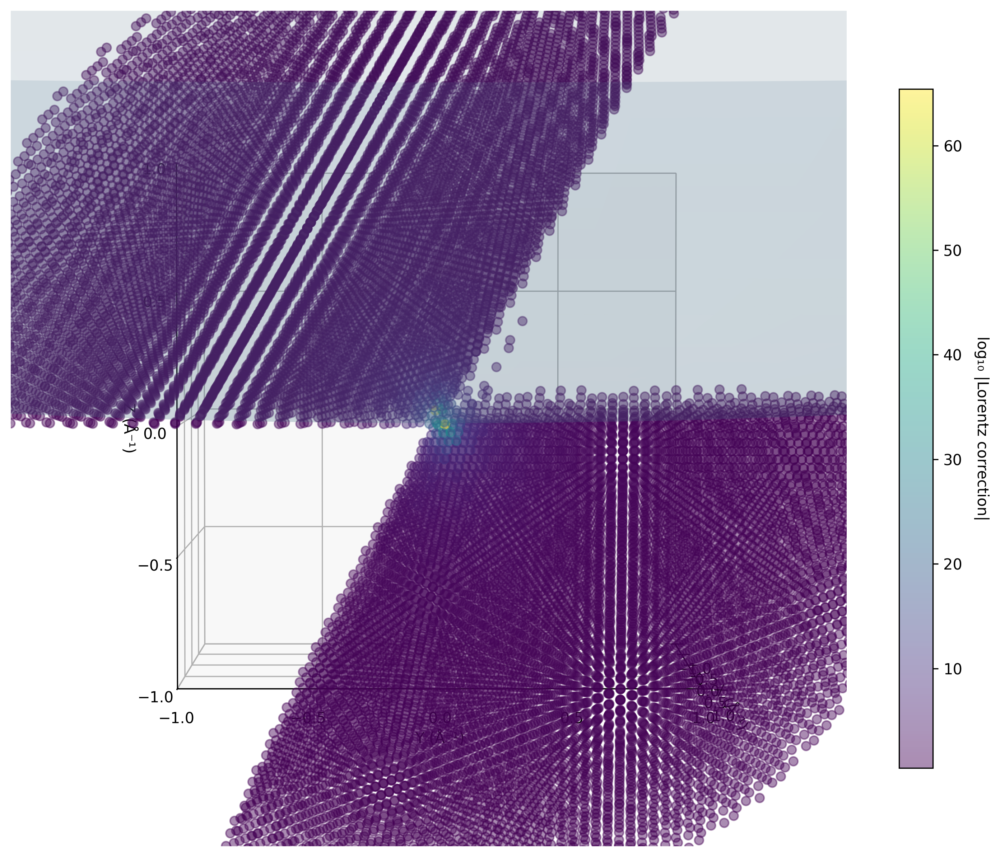

(-15, -6, -3) 0.7526534405392057
(-15, -6, -2) 0.7821941240578547
(-15, -6, -1) 0.8121431739177235
(-15, -6, 0) 0.8420635027700887
(-15, -5, -5) 0.6821385346050463
(-15, -5, -4) 0.7073253388015234
(-15, -5, -3) 0.7330519216867064
(-15, -5, -2) 0.7590595273083737
(-15, -5, -1) 0.7850076660936353
(-15, -4, -7) 0.6232560693616612
(-15, -4, -6) 0.6448915518909504
(-15, -4, -5) 0.66708648592948
(-15, -4, -4) 0.6896843077545854
(-15, -4, -3) 0.712475812925076
(-15, -4, -2) 0.7351920393679383
(-15, -3, -7) 0.6114367358600094
(-15, -3, -6) 0.6311341895325617
(-15, -3, -5) 0.651135229354267
(-15, -3, -4) 0.6712691709995146
(-15, -3, -3) 0.6913208687252587
(-15, -2, -8) 0.5812318582281897
(-15, -2, -7) 0.5988244670614595
(-15, -2, -6) 0.6166476261842733
(-15, -2, -5) 0.6345608769642501
(-15, -2, -4) 0.652390155983314
(-15, -1, -8) 0.5696350438255269
(-15, -1, -7) 0.5856144522949214
(-15, -1, -6) 0.6016535083325694
(-15, -1, -5) 0.6176099267785528
(-15, 0, -9) 0.5431381436054569
(-15, 0, -8) 0.55

In [26]:
from pathlib import Path
import numpy as np
import pandas as pd
from scipy.spatial.transform import Rotation as R

# ---------------------------------------------------------
# LOAD PETS REFLECTIONS + ZONE ANGLES
# ---------------------------------------------------------
df_reflections, df_zone_angles = load_reflections_and_angles(
    Path(str(REPO_ROOT / "diffBloch_version_0.0.1/data/cspbbr3/CsPbBr_P67-crot-050_dyn.cif_pets"))
)

# ---------------------------------------------------------
# ALL UNIQUE HKLs (FULL RECIPROCAL LATTICE)
# ---------------------------------------------------------
hkls_all = sorted({
    (int(h), int(k), int(l))
    for h, k, l in df_reflections[["h", "k", "l"]].itertuples(index=False, name=None)
})

hkls_grid = hkls_all
hkl = np.array(hkls_grid)

# ---------------------------------------------------------
# SINGLE ORIENTATION (FIRST FRAME ONLY)
# ---------------------------------------------------------
row0 = df_zone_angles.sort_index().iloc[0]

α0 = float(row0["alpha"])
β0 = float(row0["beta"])
ω0 = float(row0["omega"])

R_lab = (
    R.from_euler("z", ω0, degrees=True).as_matrix() @
    R.from_euler("x", α0, degrees=True).as_matrix() @
    R.from_euler("y", β0,  degrees=True).as_matrix()
)

# ---------------------------------------------------------
# UB MATRIX
# ---------------------------------------------------------
UB = np.array([
    [ 0.07086,  0.08733, -0.03138],
    [-0.02347, -0.03817, -0.07895],
    [-0.09797,  0.07231, -0.00378],
])

# ---------------------------------------------------------
# RECIPROCAL VECTORS (ALL HKLs)
# ---------------------------------------------------------
g0 = (UB @ hkl.T).T
k_vectors = (R_lab @ g0.T).T

# ---------------------------------------------------------
# LORENTZ TABLE (ALL ZONES)
# ---------------------------------------------------------
# df_out must already exist
# columns: h, k, l, zone_id, L_factor
lorentz_df = df_out

# ---------------------------------------------------------
# SINGLE LORENTZ VISUALIZATION
# ---------------------------------------------------------
plot_ewald_sphere_and_vectors_Lorentz_vis(
    k_vectors=k_vectors,
    hkls=hkls_grid,
    wavelength=0.0274,
    current_set=set(hkls_grid),
    prev_set=set(),
    lorentz_df=lorentz_df,
    step=None,
)
